<a href="https://colab.research.google.com/github/sonalgan/Data-Science-Projects/blob/main/Human_Activity_Recognition_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Human Activity Recognition with Smartphones Project**
## *Sonal Ganvir and Lan Nguyen*

The objective of this project is to develop a predictive model that can identify human activities, including Walking, Walking Upstairs, Walking Downstairs, Sitting, Standing, and Laying.

The dataset used in this project was collected from 30 individuals (referred to as "subjects" in the dataset) who wore smartphones on their waists while performing various activities. The smartphones were equipped with sensors, including accelerometers and gyroscopes, which recorded the data. Additionally, the experiment was video recorded, and the data was labeled manually.

The data captured '3-axial linear acceleration'(tAcc-XYZ) from accelerometer and '3-axial angular velocity' (tGyro-XYZ) from Gyroscope with several variations.

* Prefix 't' in those metrics denotes time.

* Suffix 'XYZ' represents 3-axial signals in X , Y, and Z directions.

The readings from 70% of the volunteers were taken as Train data and remaining 30% subjects recordings were taken as Test data.

#I. Conventional ML Methods

## Data & Libraries Import

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
path = "/content/drive/MyDrive/Smartphones_Project"

#!unzip "/content/drive/MyDrive/Smartphones_Project/train.csv.zip" -d "/content/drive/MyDrive/Smartphones_Project"
#!unzip "/content/drive/MyDrive/Smartphones_Project/test.csv.zip" -d "/content/drive/MyDrive/Smartphones_Project"

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.utils import resample

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV

from yellowbrick.classifier import ROCAUC


In [4]:
train_df = pd.read_csv("/content/drive/MyDrive/Smartphones_Project/train.csv")
train_df.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING


In [5]:
test_df = pd.read_csv("/content/drive/MyDrive/Smartphones_Project/test.csv")
test_df.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,STANDING


## Data Cleaning

 **Attribute Information**

For each record in the dataset the following is provided:

1.   Triaxial acceleration from the accelerometer (total acceleration) and the estimated body acceleration.
2.   Triaxial Angular velocity from the gyroscope.
3.   A 561-feature vector with time and frequency domain variables.
4.   Its activity label.
5.   An identifier of the subject who carried out the experiment.



In [6]:
#Initial dataframe shape
train_df.shape

(7352, 563)

In [7]:
test_df.shape   

(2947, 563)

In [8]:
#Check for NULLS
train_df.isna().sum()

tBodyAcc-mean()-X       0
tBodyAcc-mean()-Y       0
tBodyAcc-mean()-Z       0
tBodyAcc-std()-X        0
tBodyAcc-std()-Y        0
                       ..
angle(X,gravityMean)    0
angle(Y,gravityMean)    0
angle(Z,gravityMean)    0
subject                 0
Activity                0
Length: 563, dtype: int64

In [9]:
test_df.isna().sum()

tBodyAcc-mean()-X       0
tBodyAcc-mean()-Y       0
tBodyAcc-mean()-Z       0
tBodyAcc-std()-X        0
tBodyAcc-std()-Y        0
                       ..
angle(X,gravityMean)    0
angle(Y,gravityMean)    0
angle(Z,gravityMean)    0
subject                 0
Activity                0
Length: 563, dtype: int64

In [10]:
train_df['Activity'].value_counts()

LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: Activity, dtype: int64

In [11]:
X= train_df.iloc[:,:-1] #Features
y= train_df.Activity    #Target

First, we will remove the highly cocorrelated columns from the features. 

In [12]:
# Create correlation matrix
corr_matrix = X.iloc[:,:-1].corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.5
to_drop = [column for column in upper.columns if any(upper[column] > 0.5)]
print("No. of Columns to drop:",len(to_drop))

#Drop features 
X.drop(to_drop, axis=1, inplace=True)

No. of Columns to drop: 509


In [13]:
X.shape

(7352, 53)

This reduced the no. of columns drastically to 53. Now, we can check for feature importances and remove those whose significance level is < 0.01.

In [14]:
bestfeatures = SelectKBest(score_func=f_classif, k=52)
fit = bestfeatures.fit(X.iloc[:,:-1],y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
featureScores['Significance'] = featureScores.Score/featureScores.Score.max()
print(featureScores.nlargest(12,'Significance'))  #print the best features

bestFeatureCols=featureScores.nlargest(12,'Significance')['Specs'].tolist()

                             Specs         Score  Significance
7             tGravityAcc-mean()-X  29362.642369      1.000000
3                 tBodyAcc-std()-X  18213.463107      0.620294
10         tGravityAcc-entropy()-X    622.202784      0.021190
4       tBodyAcc-correlation()-X,Y    584.236533      0.019897
28     tBodyGyro-correlation()-Y,Z    547.000544      0.018629
6       tBodyAcc-correlation()-Y,Z    518.839801      0.017670
11         tGravityAcc-entropy()-Y    469.101720      0.015976
13       tGravityAcc-arCoeff()-Y,1    405.482439      0.013809
49        fBodyBodyGyroMag-maxInds    389.170643      0.013254
9                tGravityAcc-sma()    376.589306      0.012825
44          fBodyAccJerk-maxInds-Z    345.521864      0.011767
21  tBodyAccJerk-correlation()-X,Y    300.935691      0.010249


In [15]:
train_df = train_df[bestFeatureCols].join(train_df[["subject","Activity"]])
train_df.head()

,tGravityAcc-mean()-X,tBodyAcc-std()-X,tGravityAcc-entropy()-X,"tBodyAcc-correlation()-X,Y","tBodyGyro-correlation()-Y,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-entropy()-Y,"tGravityAcc-arCoeff()-Y,1",fBodyBodyGyroMag-maxInds,tGravityAcc-sma(),fBodyAccJerk-maxInds-Z,"tBodyAccJerk-correlation()-X,Y",subject,Activity
0,0.963396,-0.995279,-1.0,0.376314,0.301099,0.660790,-1.0,-0.745449,-1.000000,-0.375426,-1.00,-0.385300,1,STANDING
1,0.966561,-0.998245,-1.0,-0.013429,0.169395,0.579382,-1.0,-0.196359,-0.948718,-0.383430,-0.32,-0.208772,1,STANDING
2,0.966878,-0.995380,-1.0,-0.124698,-0.350646,0.608900,-1.0,-0.329023,-0.794872,-0.401602,-0.28,-0.120105,1,STANDING
3,0.967615,-0.996091,-1.0,-0.305693,-0.725301,0.507459,-1.0,-0.295036,-1.000000,-0.400278,-0.28,-0.127495,1,STANDING
4,0.968224,-0.998139,-1.0,-0.155804,-0.724558,0.599213,-1.0,-0.166693,-0.897436,-0.400477,0.04,-0.272884,1,STANDING


This leaves us with 12 features + 1 (subject) i.e. 13 feature columns. Let's try to visualize the data after reduction. Let's also make changes to out testing dataset.

In [16]:
test_df= test_df[bestFeatureCols].join(test_df[['subject','Activity']])
test_df.head()

,tGravityAcc-mean()-X,tBodyAcc-std()-X,tGravityAcc-entropy()-X,"tBodyAcc-correlation()-X,Y","tBodyGyro-correlation()-Y,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-entropy()-Y,"tGravityAcc-arCoeff()-Y,1",fBodyBodyGyroMag-maxInds,tGravityAcc-sma(),fBodyAccJerk-maxInds-Z,"tBodyAccJerk-correlation()-X,Y",subject,Activity
0,0.936489,-0.938404,-0.424975,0.076989,-0.301735,-0.709003,-1.0,-0.795468,-1.000000,-0.017827,0.32,-0.264860,2,STANDING
1,0.927404,-0.975415,-0.728884,-0.104983,-0.533962,0.399177,-1.0,-0.745687,-1.000000,0.057676,-0.40,-0.153197,2,STANDING
2,0.929915,-0.993819,-0.823393,0.305653,-0.730050,0.279786,-1.0,-0.231640,-0.897436,0.040561,-0.44,-0.063624,2,STANDING
3,0.928881,-0.994743,-0.823393,-0.063792,-0.891736,0.544916,-1.0,-0.233036,-0.948718,0.046106,-0.48,-0.197876,2,STANDING
4,0.926600,-0.993852,-0.830124,0.235151,-0.918319,0.457718,-1.0,-0.493331,-1.000000,0.055351,-0.24,0.086585,2,STANDING


In [17]:
print(train_df.shape, test_df.shape)

(7352, 14) (2947, 14)


## Exploratory Data Analysis

### 1. Activities in 6 groups

In [18]:
sns.set_style('whitegrid')
plt.rcParams['font.family'] = 'Dejavu Sans'

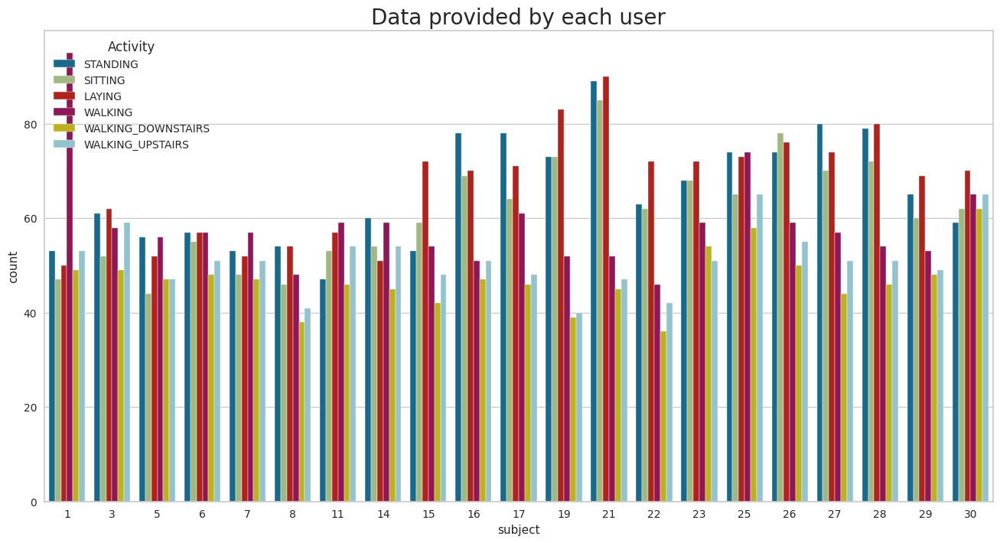

In [19]:
plt.figure(figsize=(16,8))
plt.title('Data provided by each user', fontsize=20)
sns.countplot(x='subject',hue='Activity', data = train_df)
plt.show()

It appears that we have collected a relatively similar number of readings from all subjects. This suggests that there are no significant differences in the readings, and therefore we need not be concerned about any potential biases related to subject selection.

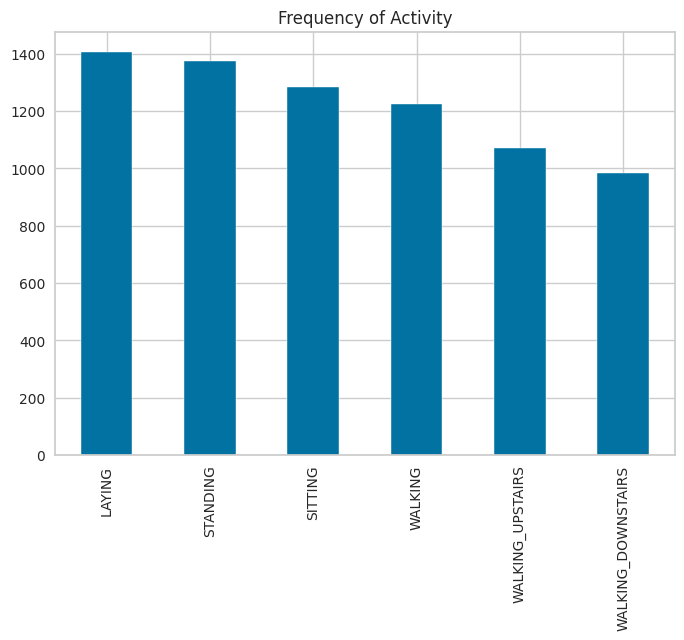

In [20]:
#Creating a plot for visualizing the class imbalance
train_df['Activity'].value_counts().plot(kind = 'bar', title = 'Frequency of Activity');

Based on the bar chart, we can see that the highest activities are Stationary activities (Laying, Standing, and Sitting). While the lowest activities are Moving activities (Walking, Walking_Upstairs, and Walking_downstairs).

We now will explore further on the activities.

### 2. Stationary activities and Moving activities

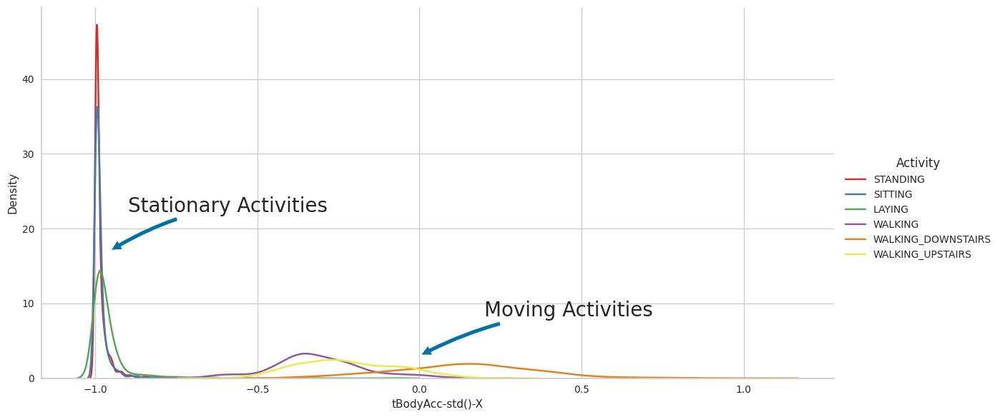

In [21]:
sns.set_palette("Set1", desat=0.80)
facetgrid = sns.FacetGrid(train_df, hue='Activity', height=6,aspect=2)
facetgrid.map(sns.distplot,'tBodyAcc-std()-X', hist=False)\
    .add_legend()
plt.annotate("Stationary Activities", xy=(-0.956,17), xytext=(-0.9, 23), size=20,\
            va='center', ha='left',\
            arrowprops=dict(arrowstyle="simple",connectionstyle="arc3,rad=0.1"))

plt.annotate("Moving Activities", xy=(0,3), xytext=(0.2, 9), size=20,\
            va='center', ha='left',\
            arrowprops=dict(arrowstyle="simple",connectionstyle="arc3,rad=0.1"))
plt.show()

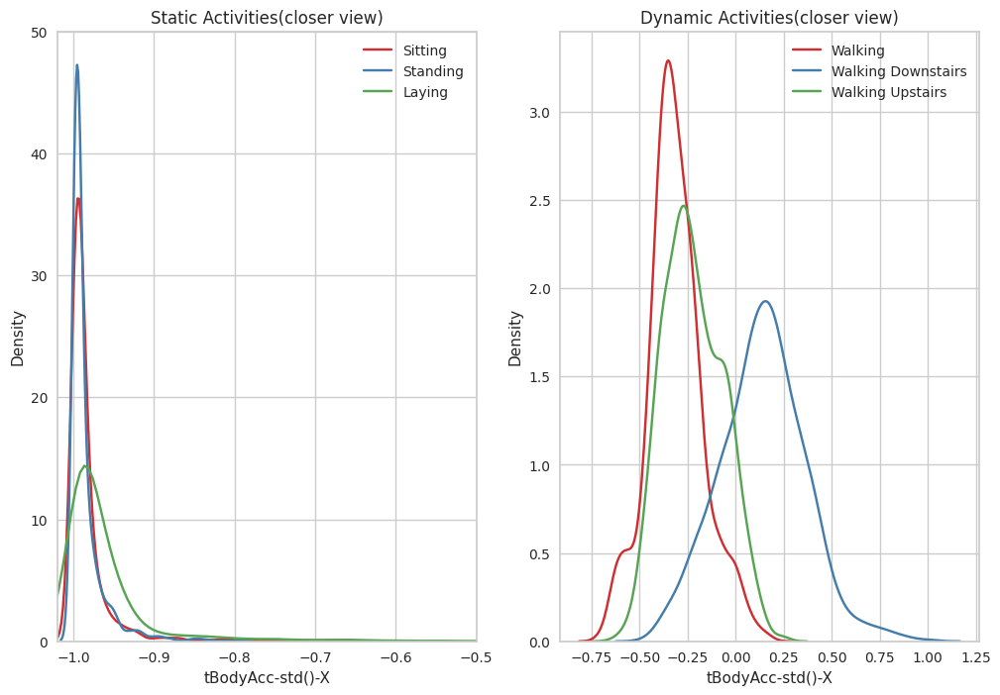

In [22]:
df1 = train_df[train_df['Activity']==1]
df2 = train_df[train_df['Activity']==2]
df3 = train_df[train_df['Activity']==3]
df4 = train_df[train_df['Activity']==4]
df5 = train_df[train_df['Activity']==5]
df6 = train_df[train_df['Activity']==6]

plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.title("Static Activities(closer view)")
sns.kdeplot(train_df[train_df["Activity"]=="SITTING"]['tBodyAcc-std()-X'], label = 'Sitting')
sns.kdeplot(train_df[train_df["Activity"]=="STANDING"]['tBodyAcc-std()-X'], label = 'Standing')
sns.kdeplot(train_df[train_df["Activity"]=="LAYING"]['tBodyAcc-std()-X'], label = 'Laying')
plt.axis([-1.02, -0.5, 0, 50])
plt.legend(loc='upper right')

plt.subplot(1,2,2)
plt.title("Dynamic Activities(closer view)")
sns.kdeplot(train_df[train_df["Activity"]=="WALKING"]['tBodyAcc-std()-X'], label = 'Walking')
sns.kdeplot(train_df[train_df["Activity"]=="WALKING_DOWNSTAIRS"]['tBodyAcc-std()-X'], label = 'Walking Downstairs')
sns.kdeplot(train_df[train_df["Activity"]=="WALKING_UPSTAIRS"]['tBodyAcc-std()-X'], label = 'Walking Upstairs')
plt.legend(loc='upper right')

The above graphs provide a better visual representation of the distribution of Stationary and Moving Activities. It is evident that the Stationary Activities exhibit significantly higher values compared to the Moving Activities. 

This suggests that people are now engaging in much less physical movement and are spending more time in a stationary position.

### 3. Magnitude of an acceleration

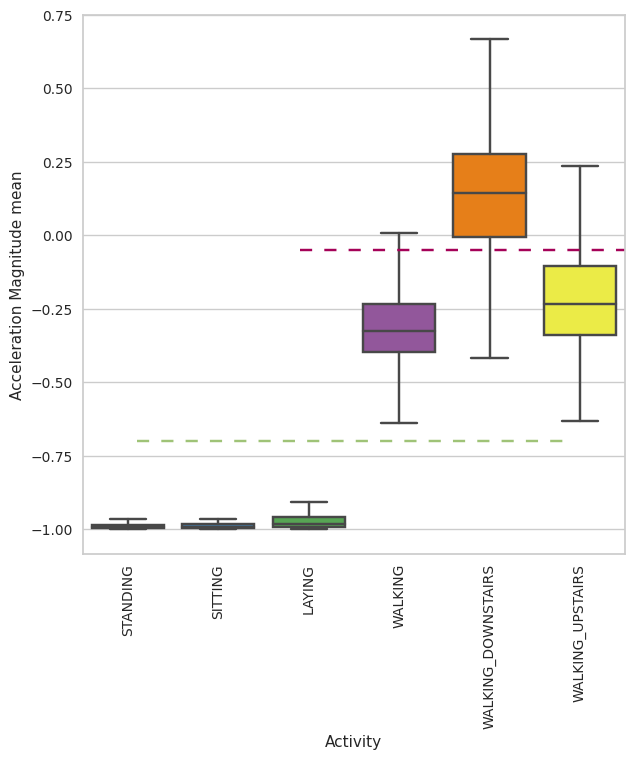

In [23]:
plt.figure(figsize=(7,7))
sns.boxplot(x='Activity', y='tBodyAcc-std()-X',data=train_df, showfliers=False, saturation=1)
plt.ylabel('Acceleration Magnitude mean')
plt.axhline(y=-0.7, xmin=0.1, xmax=0.9,dashes=(5,5), c='g')
plt.axhline(y=-0.05, xmin=0.4, dashes=(5,5), c='m')
plt.xticks(rotation=90)
plt.show()

Key observations:

* When the tAccMean is less than -0.8, the Activities are either Standing, Sitting, or Laying.
* When the tAccMean is greater than -0.6, the Activities are either Walking, Walking Downstairs, or Walking Upstairs.
* When the tAccMean is greater than 0.0, the Activity is Walking Downstairs.
* Using these criteria, we can classify Activity labels with 75% accuracy, with some errors.

Note: These observations suggest that the tAccMean feature may be a useful predictor for Activity classification. However, further analysis is needed to confirm this and identify additional features that may improve classification accuracy.

## Class Balancing 

In [24]:
train_df.Activity.value_counts()

LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: Activity, dtype: int64

In [25]:

# Fix the imbalance problem
df=train_df

df_LAYING = resample(df[df['Activity']=='LAYING'],
               replace=True,
               n_samples=1407,
               random_state=123)

df_STANDING = resample(df[df['Activity']=='STANDING'],
               replace=True,
               n_samples=1407,
               random_state=123)
df_WALKING = resample(df[df['Activity']=='WALKING'],
               replace=True,
               n_samples=1407,
               random_state=123)
df_SITTING = resample(df[df['Activity']=='SITTING'],
               replace=True,
               n_samples=1407,
               random_state=123)
df_WALKING_UPSTAIRS = resample(df[df['Activity']=='WALKING_UPSTAIRS'],
               replace=True,
               n_samples=1407,
               random_state=123)
df_WALKING_DOWNSTAIRS = resample(df[df['Activity']=='WALKING_DOWNSTAIRS'],
               replace=True,
               n_samples=1407,
               random_state=123)
del df
df_upsampled = pd.concat([df_LAYING, df_STANDING, df_WALKING, df_SITTING, df_WALKING_UPSTAIRS, df_WALKING_DOWNSTAIRS])


# Display new class counts

df_upsampled['Activity'].value_counts()

LAYING                1407
STANDING              1407
WALKING               1407
SITTING               1407
WALKING_UPSTAIRS      1407
WALKING_DOWNSTAIRS    1407
Name: Activity, dtype: int64

### Scaling & Encoding Features

In [26]:
#Creating preprocessor for the columns
numerical_cols = [0,1,2,3,4,5,6,7,8,9,10,11]
categorical_cols=[12]

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore")
numerical_preprocessor = StandardScaler()

preprocessor = ColumnTransformer([
    ('cat', categorical_preprocessor, categorical_cols),
    ('num', numerical_preprocessor, numerical_cols)])

In [27]:

import joblib

#scaler = StandardScaler()
#numerical_X = scaler.fit_transform(numerical_X)
#joblib.dump(scaler, "NumericalColumnScaler.pkl") 

#X = numerical_X, categorical_X])
#X

## Data Modelling

In [28]:
X_train,y_train = (df_upsampled.drop(columns=["Activity"]),df_upsampled.Activity) 
X_test, y_test = (test_df.drop(columns=["Activity"]),test_df.Activity) 

In [29]:
print("Shape of training set: Features ->",X_train.shape," Target ->",y_train.shape)
print("Shape of testing set: Features ->",X_test.shape," Target ->",y_test.shape)

Shape of training set: Features -> (8442, 13)  Target -> (8442,)
Shape of testing set: Features -> (2947, 13)  Target -> (2947,)


### 1) Decision Tree

#### Initial Modelling

In [30]:
dtree = Pipeline(steps=[('preprocessor', preprocessor),
                       ('classiffier', DecisionTreeClassifier(random_state=1))])

dtree.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  [12]),
                                                 ('num', StandardScaler(),
                                                  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11])])),
                ('classiffier', DecisionTreeClassifier(random_state=1))])

In [31]:
y_pred = dtree.predict(X_test) 
print(classification_report(y_test,y_pred))


                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       537
           SITTING       0.76      0.70      0.73       491
          STANDING       0.74      0.79      0.77       532
           WALKING       0.80      0.87      0.83       496
WALKING_DOWNSTAIRS       0.79      0.73      0.76       420
  WALKING_UPSTAIRS       0.73      0.72      0.72       471

          accuracy                           0.81      2947
         macro avg       0.80      0.80      0.80      2947
      weighted avg       0.81      0.81      0.81      2947



#### Parameter Optimization

In [32]:
dtree = Pipeline([('preprocessor', preprocessor),
                       ('classifier', DecisionTreeClassifier(random_state=1))])

param_grid = { 'classifier__max_depth': [2, 3, 4, 5, 6, 7], 'classifier__min_samples_leaf': [2, 20, 50,70], 
               'classifier__max_leaf_nodes': [5, 9, 15, 21, 27]}
gs_dt = GridSearchCV(dtree, param_grid, cv=10, n_jobs=-1,verbose=1)
gs_dt.fit(X_train, y_train)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         [12]),
                                                                        ('num',
                                                                         StandardScaler(),
                                                                         [0, 1,
                                                                          2, 3,
                                                                          4, 5,
                                                                          6, 7,
                                                                          8, 9,
                                                                          10,
                                                                          11])])),
                                       ('classifier',
                                        DecisionTreeClassifier(random_state=1))]),
             n_jobs=-1,
             param_grid={'classifier__max_depth': [2, 3, 4, 5, 6, 7],
                         'classifier__max_leaf_nodes': [5, 9, 15, 21, 27],
                         'classifier__min_samples_leaf': [2, 20, 50, 70]},
             verbose=1)

In [33]:
print(f'The best model is: \n{gs_dt.best_estimator_.get_params()["classifier"]}')

The best model is: 
DecisionTreeClassifier(max_depth=7, max_leaf_nodes=27, min_samples_leaf=2,
                       random_state=1)


#### Performance Metrics

In [34]:
tree_opt = gs_dt.best_estimator_
print(f'Decision tree has {tree_opt.get_params()["classifier__max_leaf_nodes"]} nodes with maximum depth {tree_opt.get_params()["classifier__max_depth"]}.') 
print(f'Model Accuracy: {tree_opt.score(X_train, y_train)}')

Decision tree has 27 nodes with maximum depth 7.
Model Accuracy: 0.9013266998341625


In [35]:
y_pred = tree_opt.predict(X_test) 
print(classification_report(y_test,y_pred))

                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       537
           SITTING       0.88      0.66      0.75       491
          STANDING       0.75      0.92      0.82       532
           WALKING       0.81      0.91      0.86       496
WALKING_DOWNSTAIRS       0.80      0.72      0.76       420
  WALKING_UPSTAIRS       0.77      0.75      0.76       471

          accuracy                           0.83      2947
         macro avg       0.83      0.82      0.82      2947
      weighted avg       0.84      0.83      0.83      2947



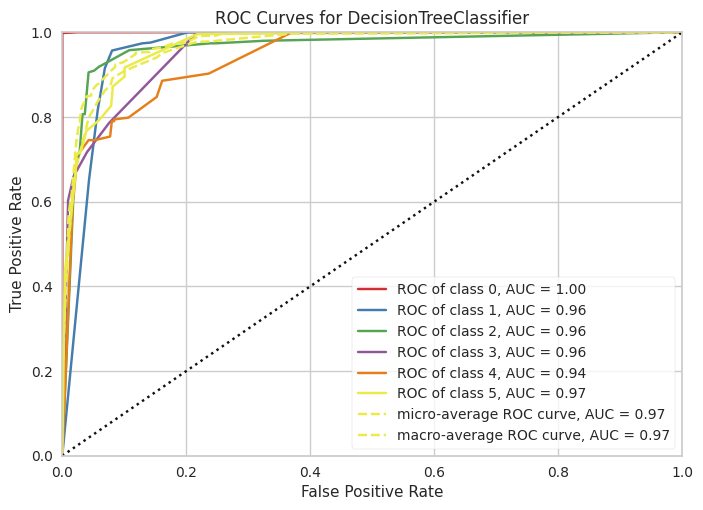

<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [36]:
y_test_roc = y_test.map({'LAYING':0, 'STANDING':1, 'WALKING':2, 'SITTING':3, 'WALKING_UPSTAIRS':4,
       'WALKING_DOWNSTAIRS':5}).astype(int)
y_train_roc= y_train.map({'LAYING':0, 'STANDING':1, 'WALKING':2, 'SITTING':3, 'WALKING_UPSTAIRS':4,
       'WALKING_DOWNSTAIRS':5}).astype(int)

viz=ROCAUC(DecisionTreeClassifier(max_depth=7, max_leaf_nodes=27, min_samples_leaf=2,
                       random_state=1))
viz.fit(X_train,y_train_roc)
viz.score(X_test, y_test_roc)        # Evaluate the model on the test data
viz.show()

### 2) K-Nearest Neighbours

#### Initial Modelling

In [37]:
from sklearn.neighbors import KNeighborsClassifier
knn = Pipeline([('preprocessor', preprocessor),
                       ('classifier', KNeighborsClassifier())])
knn.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  [12]),
                                                 ('num', StandardScaler(),
                                                  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11])])),
                ('classifier', KNeighborsClassifier())])

In [38]:
y_pred = knn.predict(X_test) 
print(classification_report(y_test,y_pred))

                    precision    recall  f1-score   support

            LAYING       1.00      0.99      0.99       537
           SITTING       0.70      0.63      0.66       491
          STANDING       0.70      0.78      0.74       532
           WALKING       0.82      0.82      0.82       496
WALKING_DOWNSTAIRS       0.70      0.77      0.73       420
  WALKING_UPSTAIRS       0.79      0.70      0.75       471

          accuracy                           0.79      2947
         macro avg       0.79      0.78      0.78      2947
      weighted avg       0.79      0.79      0.79      2947



#### Parameter Optimization

In [39]:
hyperparameters = { "classifier__n_neighbors":list(range(2,30))}

#Create new KNN object
knn = Pipeline([('preprocessor', preprocessor),
                       ('classifier', KNeighborsClassifier())])#Use GridSearch

clf = GridSearchCV(knn, hyperparameters, cv=10,verbose=1)

clf.fit(X_train, y_train)

Fitting 10 folds for each of 28 candidates, totalling 280 fits


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         [12]),
                                                                        ('num',
                                                                         StandardScaler(),
                                                                         [0, 1,
                                                                          2, 3,
                                                                          4, 5,
                                                                          6, 7,
                                                                          8, 9,
                                                                          10,
                                                                          11])])),
                                       ('classifier', KNeighborsClassifier())]),
             param_grid={'classifier__n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                     11, 12, 13, 14, 15, 16, 17,
                                                     18, 19, 20, 21, 22, 23, 24,
                                                     25, 26, 27, 28, 29]},
             verbose=1)

In [40]:
print(f'The best model is: \n{clf.best_estimator_.get_params()["classifier"]}')

The best model is: 
KNeighborsClassifier(n_neighbors=2)


#### Performance Metrics

In [41]:
clf_opt= clf.best_estimator_
clf.best_estimator_.get_params()

print(f'K Nearest Neighbours has {clf_opt.get_params()["classifier__n_neighbors"]} neighbours.') 
print(f'Model Accuracy: {clf_opt.score(X_train, y_train)}')

K Nearest Neighbours has 2 neighbours.
Model Accuracy: 0.9937218668561952


In [42]:
y_pred = clf_opt.predict(X_test) 
print(classification_report(y_test,y_pred))

                    precision    recall  f1-score   support

            LAYING       0.99      0.99      0.99       537
           SITTING       0.64      0.69      0.66       491
          STANDING       0.71      0.67      0.69       532
           WALKING       0.81      0.84      0.83       496
WALKING_DOWNSTAIRS       0.72      0.77      0.75       420
  WALKING_UPSTAIRS       0.80      0.69      0.74       471

          accuracy                           0.78      2947
         macro avg       0.78      0.78      0.78      2947
      weighted avg       0.78      0.78      0.78      2947



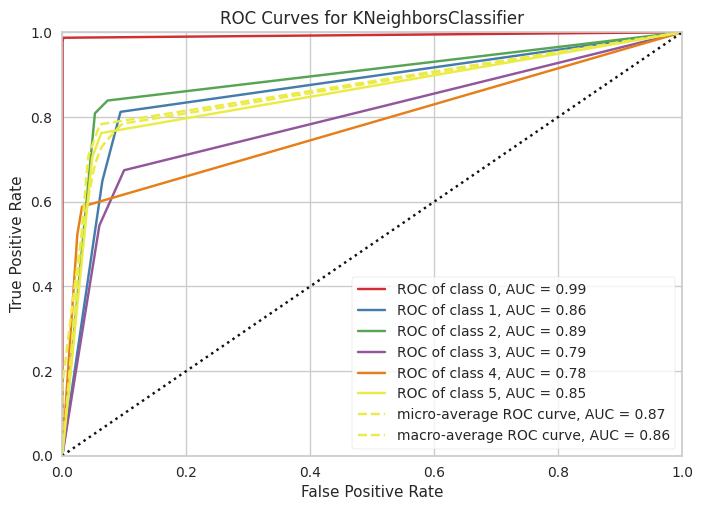

<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [43]:
viz=ROCAUC(KNeighborsClassifier(n_neighbors=2))
viz.fit(X_train,y_train_roc)
viz.score(X_test, y_test_roc)        # Evaluate the model on the test data
viz.show()

### 3) Random Forest

#### Initial Modelling

In [44]:
from sklearn.ensemble import RandomForestClassifier

rf = Pipeline([('preprocessor', preprocessor),
                       ('classifier', RandomForestClassifier(random_state=1))])
rf.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  [12]),
                                                 ('num', StandardScaler(),
                                                  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                   10, 11])])),
                ('classifier', RandomForestClassifier(random_state=1))])

In [45]:
y_pred = rf.predict(X_test) 
print(classification_report(y_test,y_pred))

                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       537
           SITTING       0.84      0.71      0.77       491
          STANDING       0.77      0.88      0.82       532
           WALKING       0.87      0.86      0.87       496
WALKING_DOWNSTAIRS       0.78      0.87      0.82       420
  WALKING_UPSTAIRS       0.85      0.79      0.82       471

          accuracy                           0.85      2947
         macro avg       0.85      0.85      0.85      2947
      weighted avg       0.86      0.85      0.85      2947



#### Parameter Optimization

In [46]:
param_grid = { 
    'classifier__n_estimators': [200],
    'classifier__max_features': [ 'sqrt', 'log2'],
    'classifier__max_depth' : [5,6,7,8],
    'classifier__criterion' :['gini', 'entropy']
}

#Create new RF object
rf = Pipeline([('preprocessor', preprocessor),
                       ('classifier', RandomForestClassifier(random_state=1))])
#Use GridSearch

rfc = GridSearchCV(rf, param_grid, cv=10,verbose=1)

rfc.fit(X_train, y_train)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         [12]),
                                                                        ('num',
                                                                         StandardScaler(),
                                                                         [0, 1,
                                                                          2, 3,
                                                                          4, 5,
                                                                          6, 7,
                                                                          8, 9,
                                                                          10,
                                                                          11])])),
                                       ('classifier',
                                        RandomForestClassifier(random_state=1))]),
             param_grid={'classifier__criterion': ['gini', 'entropy'],
                         'classifier__max_depth': [5, 6, 7, 8],
                         'classifier__max_features': ['sqrt', 'log2'],
                         'classifier__n_estimators': [200]},
             verbose=1)

In [47]:
print(f'The best model is: \n{rfc.best_estimator_.get_params()["classifier"]}')

The best model is: 
RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=1)


#### Performance Metrics

In [48]:
rfc_opt= rfc.best_estimator_
rfc.best_estimator_.get_params()

#print(f'K Nearest Neighbours has {clf_opt.get_params()["classifier__n_neighbors"]} neighbours.') 
print(f'Model Accuracy: {rfc_opt.score(X_train, y_train)}')

Model Accuracy: 0.9488272921108742


In [49]:
y_pred = rfc_opt.predict(X_test) 
print(classification_report(y_test,y_pred))

                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       537
           SITTING       0.88      0.68      0.77       491
          STANDING       0.76      0.91      0.83       532
           WALKING       0.84      0.89      0.86       496
WALKING_DOWNSTAIRS       0.81      0.83      0.82       420
  WALKING_UPSTAIRS       0.86      0.79      0.82       471

          accuracy                           0.85      2947
         macro avg       0.86      0.85      0.85      2947
      weighted avg       0.86      0.85      0.85      2947



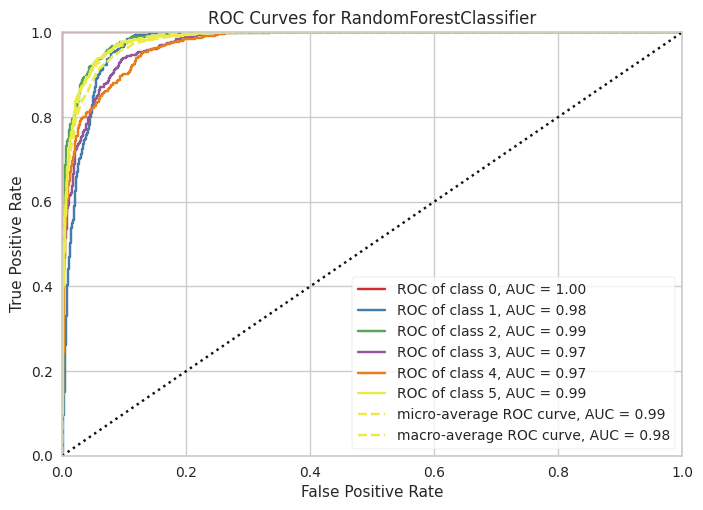

<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [51]:
viz=ROCAUC(RandomForestClassifier(criterion='entropy', max_depth=8, n_estimators=200,
                       random_state=1))
viz.fit(X_train,y_train_roc)
viz.score(X_test, y_test_roc)        # Evaluate the model on the test data
viz.show()

# II. AutoML

In [52]:
!pip install pycaret
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 19.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 99.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 90.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 5.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting req

In [53]:
import pycaret.classification as pycc
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

Imported v0.1.603. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [54]:
train_df = pd.read_csv("/content/drive/MyDrive/Smartphones_Project/train.csv")
test_df = pd.read_csv("/content/drive/MyDrive/Smartphones_Project/test.csv")

In [55]:
exp_clf = pycc.setup(data = train_df,
                     test_data = test_df,
                     target = 'Activity', 
                     session_id=123,
                     remove_multicollinearity = True,
                     multicollinearity_threshold = 0.5,
                     feature_selection = True,
                     feature_selection_method='univariate',
                     n_features_to_select=12,
                     normalize=True,
                     fix_imbalance = True) 


,Description,Value
0,Session id,123
1,Target,Activity
2,Target type,Multiclass
3,Target mapping,"LAYING: 0, SITTING: 1, STANDING: 2, WALKING: 3, WALKING_DOWNSTAIRS: 4, WALKING_UPSTAIRS: 5"
4,Original data shape,"(10299, 563)"
5,Transformed data shape,"(17558, 13)"
6,Transformed train set shape,"(11664, 13)"
7,Transformed test set shape,"(5894, 13)"
8,Numeric features,562
9,Preprocess,True


Shape of your Data Set loaded: (17558, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
tGravityAcc-sma(),0.000000,66.431256,float32,11664,0,0,
tGravityAcc-energy()-Y,0.000000,66.294567,float32,11640,0,0,right skewed distribution: cap or drop outliers
tGravityAcc-entropy()-Y,0.000000,10.462467,float32,1837,0,0,right skewed distribution: cap or drop outliers
tGravityAcc-arCoeff()-Z4,0.000000,66.414170,float32,11661,0,0,
tBodyAccJerk-arCoeff()-X4,0.000000,66.425561,float32,11663,0,0,
tBodyAccJerk-correlation()-XY,0.000000,66.425561,float32,11663,0,0,
tBodyGyro-correlation()-YZ,0.000000,66.431256,float32,11664,0,0,
tBodyGyroJerk-entropy()-Z,0.000000,43.142727,float32,7575,0,0,
tBodyGyroJerk-arCoeff()-Z3,0.000000,66.402779,float32,11659,0,0,
fBodyAccJerk-maxInds-Z,0.000000,6.509853,float32,1143,0,0,


    12 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################


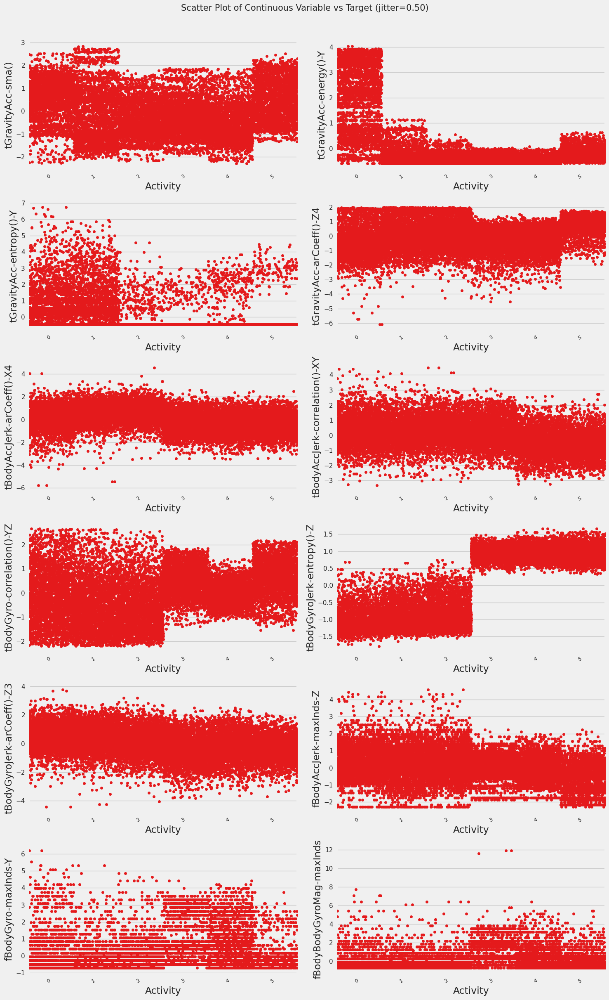

Total Number of Scatter Plots = 78


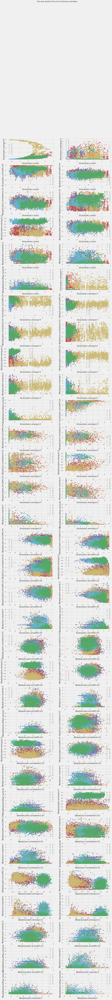

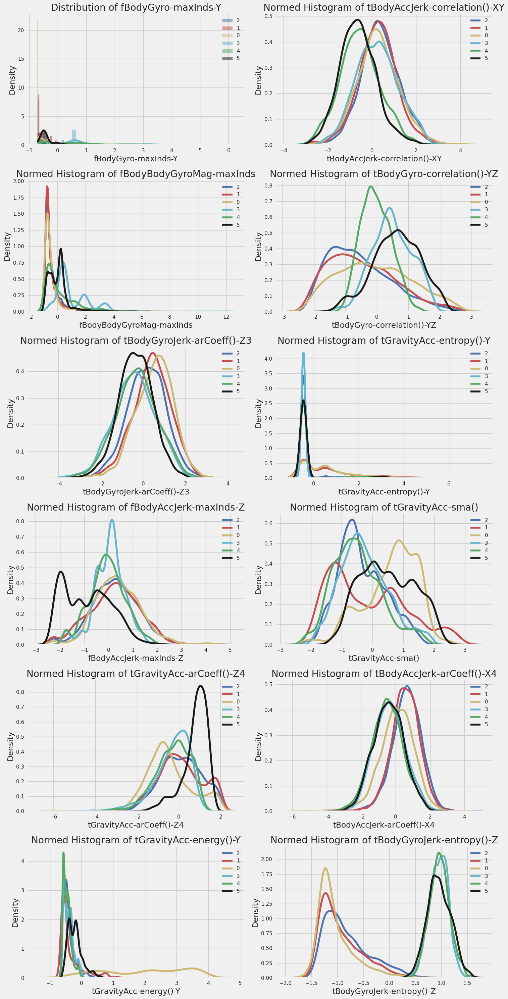

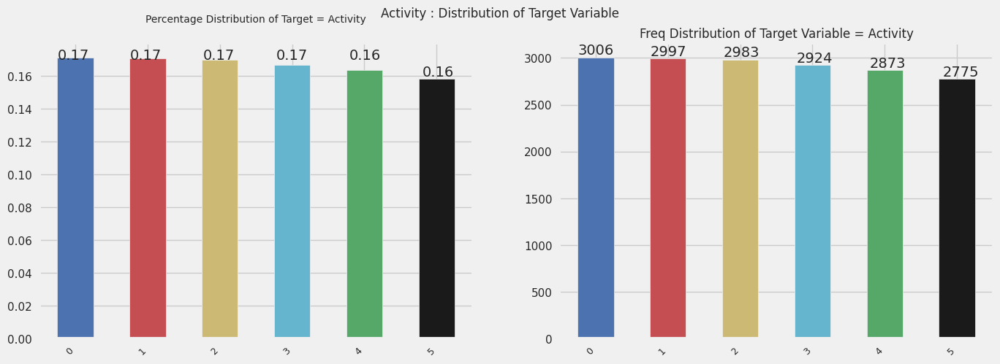

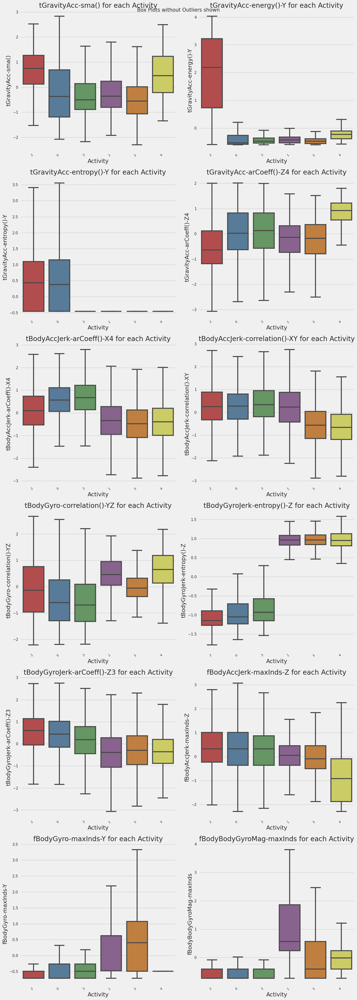

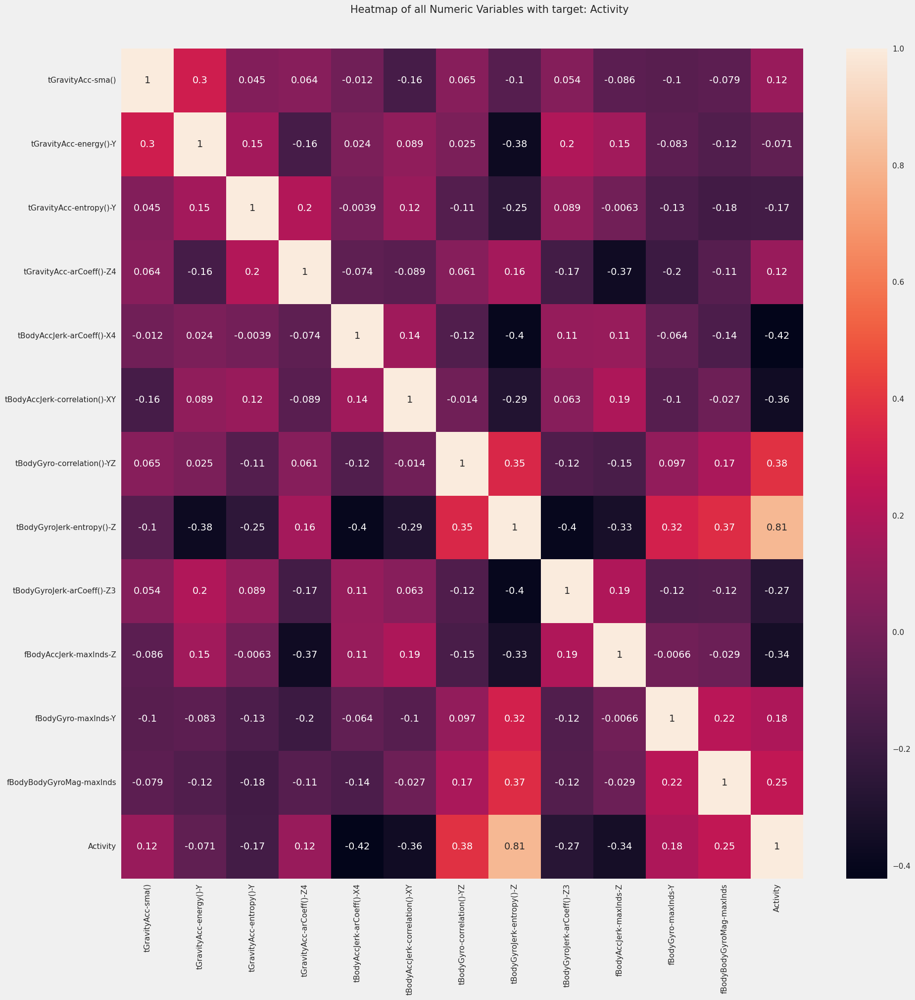

All Plots done
Time to run AutoViz = 64 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [56]:
## Auto Visualization

df=pycc.get_config("dataset_transformed")

AV = AutoViz_Class()
dftc = AV.AutoViz(filename="",
         sep=",",
         depVar="Activity",
         dfte=df,
         header=0,
         verbose=1,
         lowess=False,
         chart_format="png",
         max_rows_analyzed=150000,
         max_cols_analyzed=30,
         )

In [57]:
available_models = pycc.models()
available_models

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsClassifier,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDClassifier,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessClassifier,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron.MLPClassifier,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [58]:
best_clf = pycc.compare_models()           # Training model

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.8103,0.9718,0.8103,0.8210,0.8099,0.7719,0.7741,2.9890
rf,Random Forest Classifier,0.8092,0.9708,0.8092,0.8195,0.8089,0.7706,0.7727,3.6870
gbc,Gradient Boosting Classifier,0.8054,0.9715,0.8054,0.8159,0.8050,0.7660,0.7681,18.7760
xgboost,Extreme Gradient Boosting,0.7989,0.9697,0.7989,0.8088,0.7989,0.7583,0.7601,10.3910
lightgbm,Light Gradient Boosting Machine,0.7978,0.9710,0.7978,0.8070,0.7971,0.7570,0.7589,3.3490
lr,Logistic Regression,0.7531,0.9579,0.7531,0.7662,0.7511,0.7030,0.7063,9.5920
qda,Quadratic Discriminant Analysis,0.7401,0.9550,0.7401,0.7501,0.7359,0.6870,0.6905,1.9360
knn,K Neighbors Classifier,0.7393,0.9263,0.7393,0.7476,0.7383,0.6865,0.6882,2.8110
svm,SVM - Linear Kernel,0.7392,0.0000,0.7392,0.7534,0.7367,0.6862,0.6897,1.6470
lda,Linear Discriminant Analysis,0.7300,0.9532,0.7300,0.7458,0.7285,0.6755,0.6789,1.9600


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# III. Model Comparision

1. Decision Tree:
* The accuracy is 81% before Parameter Optimization and 83% after Parameter Optimization.

2. KNN:
* The accuracy is 79% before Parameter Optimization and 78% after Parameter Optimization.

3. Random Forest:
* The accuracy is 85% in both before and after Parameter Optimization.

4. Auto ML:
* Extra Trees Classifier has the highest accuracy of 81% and highest AUC of 97%.
* The second highest accuracy is Random Forest Classifier with 81% and AUC of 97%.

# IV. Conclusion

The Human Activity Recognition project with smartphones aims to classify the six daily activities performed by individuals using data obtained from smartphone sensors. Exploratory Data Analysis (EDA) helped us gain a better understanding of the dataset through visualized graphs. The EDA revealed that people engage in stationary activities such as Laying, Standing, and Sitting way more than moving activities like Walking, Walking_Upstairs, and Walking_Downstairs.

The results of our classification models indicated that Random Forest had the highest accuracy with 85% when using traditional machine learning techniques. However, with Auto Machine Learning, Extra Trees Classifier achieved the highest accuracy of 81.21% followed by Random Forest Classifier with 80.98%.

In conclusion, our study demonstrates that machine learning models can accurately classify daily human activities based on data collected from smartphone sensors. This can have important implications in various fields such as health care, sports performance, and ergonomics.
